# Final Report
# Weather Data Analysis: A Regression and Classification Approach on the ERA5 Dataset
---

Group name:  Group iBm

---

### Attempt 1:

**1. Introduction and Data**

Weather, an age-old Earth phenomenon, captivates human interest due to its intricate blend of temperature, wind, and precipitation, molding our surroundings and challenging our understanding of the natural world [^1]. Technological advancements now allow for a more profound exploration of these processes [^2]. Accurate weather prediction is crucial for agriculture, disaster management, and urban planning, particularly in the context of climate change risks [^3]. The project, titled "Weather Data Analysis: A Regression and Classification Approach on the ERA5 Dataset," aims to contribute to this exploration by examining how different variables interact to create complex weather phenomena.

The study leverages the ERA5, a high-quality global atmospheric reanalysis dataset covering multiple decades [^4]. Focusing on the region of Bancroft in Ontario, Canada, the project explores the unique climatic and meteorological characteristics of the area, influenced by the 'lake-effect' phenomenon [^6]. This provides an excellent case study for analyzing relationships among different atmospheric elements [^7]. The evaluation is limited to the years 2015 to 2022 to capture the latest climate developments.

**1.2 Data**

The ERA5 dataset, sourced from the European Centre for Medium-Range Weather Forecasts (ECMWF), spans multiple decades (2015-2022) at hourly intervals with a spatial resolution of approximately 31 km. Various meteorological parameters are included, such as temperature, precipitation, wind speed, and atmospheric pressure [^10].

In [27]:
# import dependencies 
import pandas as pd
import numpy as np
import datetime
import math
import matplotlib.pyplot as plt
from matplotlib import rcParams
import seaborn as sns
from sklearn.preprocessing import StandardScaler
import warnings
from sklearn import svm
import datetime
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error, classification_report, confusion_matrix, accuracy_score, precision_score, recall_score, f1_score
from sklearn.linear_model import LinearRegression, LogisticRegression, SGDRegressor
from sklearn.ensemble import GradientBoostingRegressor, GradientBoostingClassifier, ExtraTreesClassifier, RandomForestClassifier, GradientBoostingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVR
from sklearn.pipeline import make_pipeline
from xgboost import XGBClassifier
#from lightgbm import LGBMClassifier
import statsmodels.api as sm
import pickle
from sklearn.tree import plot_tree
from tabulate import tabulate
import plotly.express as px
from sklearn.decomposition import PCA
warnings.filterwarnings("ignore")

#import data
df_full = pd.read_csv("../data/external/feature_data_substation_bancroft_labelled.csv")
df_full.head(3)

,Unnamed: 0,substation,run_datetime,valid_datetime,horizon,avg_temp,avg_windspd,avg_windgust,avg_pressure_change,avg_snow,...,MA_avg_winddir_month,MA_avg_temp_change_month,label0,label1,label2,label3,wep,storm_id2,year,month
0,0,Bancroft,2015-07-15 00:00:00,2015-07-15 00:00:00,0.0,287.389224,3.386380,11.136197,52.892217,0.0,...,80.302464,NaN,0,1,NaN,1,Blue sky day,NaN,2015,7
1,1,Bancroft,2015-07-15 01:00:00,2015-07-15 01:00:00,0.0,287.378997,3.326687,11.002795,50.256685,0.0,...,78.584418,-0.010227,0,1,NaN,1,Blue sky day,NaN,2015,7
2,2,Bancroft,2015-07-15 02:00:00,2015-07-15 02:00:00,0.0,287.388845,3.243494,10.700595,47.944054,0.0,...,77.809235,-0.000189,3,1,NaN,1,Blue sky day,NaN,2015,7


### Methodology

Die erste Phase der Methologie konzentrierte sich auf die umfassende Vorbereitung und Aufbereitung des ERA5-Datensatzes, 
um eine solide Basis für die anschließende Analyse sicherzustellen. 
Diese Phase hat das Ziel die Datenqualität zu gewährleisten und die Genauigkeit der Modelle zu maximieren.

2.1 Datenerfassung
Zunächst wurde der ERA5-Datensatz importiert und anschließend ausgelesen. Dafür wurden die ersten Zeilen sowie die Metadaten des Datensatzes betrachtet, um den Datensatz für die weitere Analyse vorzubereiten. Dieser Prozess beinhaltete die Auswahl relevanter meteorologischer Variablen sowie das schaffen neuer Variablen, die für unsere Analysezwecke von Bedeutung waren.
Zuerst wird die Datums- und Zeitangaben im Datensatz in ein standardisiertes Datumsformat umgewandelt. Anschließend wird die durchschnittliche Temperatur von Kelvin in Celsius umgerechnet. Schließlich werden die Windrichtungsdaten, die in Grad angegeben waren, in kardinale Richtungen (wie Nordost, Ost usw.) umgewandelt, um die Daten anschaulicher und die Interpretation verständlicher zu gestalten.
Als Ergebnis dieser Phase wurde das Dataframe mit folgenden Variablen zur weiteren Analyse in betracht gezogen:
- Laufzeit (run_datetime): Das Datum und die Uhrzeit der Wetteraufzeichnungen.
- Wetterereignistyp (wep): Eine Klassifizierung der Wetterbedingungen anhand spezifischer Parameter zu einem bestimmten Zeitpunkt und Ort.
- Durchschnittstemperatur (avg_temp): Die durchschnittliche Temperatur, gemessen in Kelvin, basierend auf allen Sensoren für die Dauer einer Stunde.
- Durchschnittstemperatur in Celsius (avg_temp_celsius): Umrechnung der Durchschnittstemperatur von Kelvin in Celsius.
- Minimale Nassbulb-Temperatur (min_wet_bulb_temp): Die niedrigste Nassbulb-Temperatur während der Beobachtungsperiode.
- Durchschnittlicher Taupunkt (avg_dewpoint): Der durchschnittliche Taupunkt während der Beobachtungsperiode.
- Temperaturänderung (avg_temp_change): Die durchschnittliche Temperaturveränderung während der Beobachtungsperiode.
- Durchschnittliche Windgeschwindigkeit (avg_windspd): Die durchschnittliche Windgeschwindigkeit während der Beobachtungsperiode.
- Maximale Windböe (max_windgust): Die höchste beobachtete Windböe während der Beobachtungsperiode.
- Durchschnittliche Windrichtung (avg_winddir): Die durchschnittliche Windrichtung in Grad während der Beobachtungsperiode.
- Sinus der Windrichtung (avg_winddir_sin): Sinus-Transformation der durchschnittlichen Windrichtung.
- Cosinus der Windrichtung (avg_winddir_cos): Cosinus-Transformation der durchschnittlichen Windrichtung.
- Kardinale Windrichtung (wind_direction_label): Umrechnung der durchschnittlichen Windrichtung in kardinale Richtungen.
- Maximaler kumulativer Niederschlag (max_cumulative_precip): Die höchste kumulierte Niederschlagsmenge während der Beobachtungsperiode.
- Maximale Schneedichte (max_snow_density_6): Die höchste Schneedichte in einer Tiefe von 6 Zoll während der Beobachtungsperiode.
- Maximaler kumulativer Schnee (max_cumulative_snow): Die höchste kumulierte Schneemenge während der Beobachtungsperiode.
- Maximaler kumulativer Eis (max_cumulative_ice): Die höchste kumulierte Eismenge während der Beobachtungsperiode.
- Durchschnittliche Druckänderung (avg_pressure_change): Die durchschnittliche Veränderung des atmosphärischen Drucks während der Beobachtungsperiode.
- Zusätzliche WEP-Labels (label0, label1, label2): Zusätzliche Kategorien zur Differenzierung verschiedener Wetterereignisse, einschließlich blauer Himmel und extremer Wetterbedingungen


2.2 Analyse und Visualisierung
Die zweite Phase der Methologie umfasst eine tiefgehende Analyse und Visualisierung der Daten, um Erkenntnisse zu sammeln die Entscheidend für die Zielsetzung sein könnten. 

Eine nähere Betrachtung der Wetterereignistypen hat gezeigt, dass ´Blue sky day´ mit einer Häufigkeit von 42106 am meisten vertreten ist, anschließend folgt 
mild snowfall mit 3598, moderate snowfall mit 2336 und moderate rainfall mit 2104. Extremwetterereignisse sind relativ wenig vertreten. Storm with freezing rain / heavy snow- and icestorm ist lediglich 69 mal, continuous freezing rain 37 mal, storm with freezing rain / heavy snow- and icestorm 17 mal und snowstorm with high precipitation 10 mal vorgekommen. 

Anschließend wird die zeitliche Komponente untersucht in dem sinngemäß einzigartige Variablen über die Zeit geplottet werden.

- Saisonale Temperaturmuster: Deutlich sichtbar ist eine jährliche Zyklizität in den Temperaturparametern, mit höheren Werten im Sommer und niedrigeren im Winter. Die gleitenden Durchschnitte, sowohl auf wöchentlicher als auch auf monatlicher Basis, glätten die täglichen Schwankungen und verstärken die beobachteten saisonalen Trends.
- Windcharakteristika: Windgeschwindigkeit und -böen zeigen eine hohe tägliche Variabilität ohne erkennbare saisonale Muster. Dies lässt darauf schließen, dass die Windmuster in Bancroft komplexen und vielschichtigen Wetterdynamiken unterliegen und nicht nur einfachen saisonalen Einflüssen.
- Variabilität der Windrichtung: Ähnlich wie bei der Windgeschwindigkeit zeigt die Windrichtung eine hohe Variabilität ohne erkennbaren saisonalen Trend, was darauf hinweist, dass lokale geografische und meteorologische Komplexitäten die Windmuster erheblich beeinflussen.
- Schneefallmuster und -dichte: Die Schneedaten zeigen ein ausgeprägtes saisonales Muster, das invers mit den Temperaturdaten korreliert ist. Spitzen während der Wintermonate korrespondieren mit den Temperaturtiefs, und die Schneedichte scheint mit nachfolgenden Schneefällen zuzunehmen, was auf eine Verdichtung im Laufe der Zeit hindeutet.
- Druckänderungen: Die durchschnittliche Druckänderung spiegelt das Diagramm der Temperaturänderung eng wider und deutet auf eine starke Beziehung zwischen atmosphärischem Druck und Temperatur hin, wobei saisonale Faktoren einen bedeutenden Einfluss auf diese Variationen zu haben scheinen.
Die Ergebnisse können in der appendix xy betrachtet werden. 



Eine Häufigkeitsverteilung der Wetterparameter in Form eines Histogramms erlaubt es zusätzliche Erkenntnisse durch statistische Methoden zu erlangen:
- Temperaturen: Die bimodale Verteilung der Temperaturen mit Spitzen, die den Sommer- und Wintermonaten entsprechen, deutet auf ein klar definiertes saisonales Klima hin. Die Linksschiefe der Verteilung könnte auf eine längere Dauer oder eine größere Häufigkeit von kühleren Perioden im Jahresverlauf hindeuten, während die Symmetrie der Temperaturänderungen auf eine relative Stabilität des Klimas ohne drastische tägliche Schwankungen hinweist.
- Wind: Die Rechtsschiefe bei Windgeschwindigkeit und Windböen lässt auf eine klimatische Norm mit überwiegend mäßigen Windbedingungen schließen, wobei gelegentliche stärkere Böen die Ausnahmen bilden. Diese Schiefe könnte darauf hinweisen, dass extreme Windereignisse zwar auftreten, aber nicht dominant sind.
- Niederschlag: Ein stark rechtsschiefes Muster bei der Niederschlagsmenge zeigt, dass geringfügige Niederschlagsereignisse die Norm sind, während starke Niederschläge eher selten auftreten. Diese Verteilung könnte bedeuten, dass Bancroft vorwiegend trocken ist, mit sporadischen, intensiven Regenfällen.
- Schnee und Eis: Die extreme Rechtsschiefe in der Verteilung von Schnee und Eis spiegelt wider, dass signifikante Akkumulationen ungewöhnlich sind, was auf ein Klima hindeutet, in dem solche Ereignisse zwar selten, aber potenziell intensiv sind.
- Atmosphärischer Druck: Die geringe Variation und Schiefe bei den Druckänderungen deutet auf ein konsistentes Klima mit wenig Fluktuation hin, was für die Vorhersagbarkeit des Wetters in der Region vorteilhaft sein könnte.



Ein Boxplot bietet die Möglichkeit Parameter auf wichtige statistische Kennzahlen wie Median, Quartile, Interquartilabstand (IQR), Ausreißer und Verteilung zu untersuchen.
Für alle genannten Wetterparameter wurde ein Boxplot erstellt, welche als Ergebnis die vorherigen Untersuchungen der Time Series und des Histogramms bestätigt. Klare saisonale Schwankungen in den Temperaturen und geringe tägliche Variabilität. Windgeschwindigkeiten sind meist niedrig, mit gelegentlichen Spitzen. Niederschlagsmuster sind überwiegend gering, mit seltenen schweren Ausreißern. Schnee- und Eisakkumulationen treten selten auf, während der atmosphärische Druck überwiegend stabil bleibt. Diese Ergebnisse deuten auf ein Klima, das regelmäßige saisonale Veränderungen ausgesetzt ist, mit gelegentlichen Extremwetterereignissen.

Das Umkehren der Sicht und Gruppieren der Daten in Wetterereignisse ermöglicht Einblicke in den Einfluss der einzelnen Wetterparameter auf die ausgewählten Wetterereignisse.
Die Distogramme der Wetterdaten aus Bancroft enthüllen mehrere Schlüsselmuster: 
- Höhere Temperaturen führen eher zu ´Blue sky days´ während niedrige Temperaturen für einen milden Schneefall bis Schneesturm führen. Jedes Ergeignis ist um den Median zentriert, was bedeutet, dass alle Ereignisse bei der Median Temperatur vorkommen könnten.
- eine Konzentration der Temperaturänderungen nahe Null und die beinahme Symmetrische Form, deutet auf eine schlechte Wahl als predictor Variable hin, da jedes Ereignisse unabhängig der Temperaturänderung vorkommen kann; 
- die Winddaten zeigen, dass die Wetterereignisse schlecht durch die Windgeschwindigkeit oder Windböen seperiert werden können. Die durchschnittliche Windrichtung weist Muster auf, bestimmte Wetterereignisse scheinen häufiger bei bestimmten Werten vorzukommen. Als Prediktor Variable alleine eher nicht geeignet, da zwar Muster erkannbar, trotzdem schlecht seperierbar sind
- Die Verteilung der Niederschlags-, Schnee- und Eismengen ist rechtsschief, was häufige leichte Ereignisse und seltene intensive Vorkommnisse anzeigt, während die Druckverteilung relativ normal erscheint, was auf ein stabiles atmosphärisches Umfeld schließen lässt. Die Variablen lassen bestimmte Wetterereignisse besser seperieren, da sie sinngemäß verbunden sind wie z. B. ´max cumulative snow accreation in mm´ und Schneefal bzw. Schneesturm. 

Das gleiche wurde nochmal als Boxplot visualisiert und hat folgende Erkenntnisse gebracht:
- **Clear Skies (Blue):** High average temperatures with low precipitation, typical of clear conditions.
- **Continuous Freezing Rain (Orange):** Tight temperature ranges and variable pressure changes indicative of freezing rain conditions.
- **Light to Heavy Snowfall (Red to Green):** Low temperatures with moderate to high snow and ice accumulations, typical of varying snowfall intensities.
- **Moderate Rain and Snow (Purple and Brown):** Demonstrates variability in temperature changes and precipitation amounts.
- **Severe Storms (Pink and Grey):** Marked by extreme precipitation and snow amounts, significant temperature and pressure fluctuations, and variable wind conditions.

Selbstverständlich sind bestimmte Wetterereignisse seltener als andere, weshalb es notwendig ist sich die Verteilung anzuschauen.
Ein Kuchendiagramm welches erst alle Wetterereignisse abbildet und anschließend die Extremwetterereignisse, hat folgende Ergebnisse gebracht:
- Gesamtverteilung der Wetterereignisse: Der größte Anteil der Beobachtungen fällt unter "Blue Sky Day", was klareres Wetter ohne extreme Bedingungen bedeutet. Dieser Zustand stellt über 77.9% der gesamten Beobachtungen dar. Andere Wetterereignisse wie mäßiger Regen, leichter und mäßiger Schneefall sind ebenfalls hervorgehoben, aber weniger häufig.
- Verteilung extremer Wetterereignisse: Moderate snowfall is the most common, making up 35.4% of non-clear sky observations.
Moderate snowfall (23.0 %) and moderate rain (20.7 %) are the next most common events. Those three accumulated make up to 79.1 percent, the remaining 20.9 percent are the more extreme events.
The more extreme events include:

<ol start=?> 
<li>  Heavy snowfall with accumulated snow </li>
<li>  Frontdurchlauf / Continuous freezing rain </li>
<li>  Storm with freezing rain / Heavy snow- and icestorm </li>
<li>  Snowstorm with high precipitation, </li>
</ol>
</br>
sorted by their frequency. <br>

Anschließend wurden  Assoziationen und Korrelationen zwischen verschiedenen meteorologischen Parametern untersucht. Dazu wurden Scatterplots für alle Paare relevanter Parameter erstellt und die Korrelationskoeffizienten berechnet. Die wichtigsten Erkenntnisse:

- Starke Korrelationen zwischen ähnlich skalierten Variablen: Parameter mit ähnlichen Skalen und Maßeinheiten zeigten tendenziell stärkere Korrelationen. Beispiele sind die durchschnittliche Temperatur, Taupunkt, Temperaturänderung und die minimale Feuchtkugeltemperatur sowie durchschnittliche Windgeschwindigkeit und maximale Windböen.
- Dynamische Natur der Korrelationen: Die Korrelationen zwischen den Parametern änderten sich in Reaktion auf extreme Wetterereignisse. Diese Ereignisse scheinen die Beziehungen zwischen den Parametern maßgeblich zu beeinflussen.

Einbeziehung von Temperatur- und Windparametern in Regressionsanalysen: Obwohl keine direkte Korrelation zwischen Temperatur- und Windparametern festgestellt wurde, wurden sie dennoch in die Regressionsanalysen einbezogen. Dies beruht auf der Annahme, dass ihre Beziehung möglicherweise nichtlinear ist oder von weiteren Faktoren beeinflusst wird, die durch lineare Korrelation nicht erfasst werden.

Die Ergebnisse zeigen, dass eine umfassende Betrachtung von Korrelationen und Assoziationen zwischen meteorologischen Parametern notwendig ist, um komplexe Interaktionen und den Einfluss extremer Wetterereignisse auf diese Beziehungen zu verstehen. Die Studie legt nahe, dass für ein vollständiges Verständnis der atmosphärischen Dynamik in Bancroft eine Kombination aus linearen und nichtlinearen Analysemethoden erforderlich ist.

In einer weiteren Analyse wurde der Zusammenhang zwischen Windrichtung, Windgeschwindigkeit und Durchschnittstemperatur untersucht. Die Hauptergebnisse sind:

- Windgeschwindigkeit: Die durchschnittliche Windgeschwindigkeit variiert je nach Windrichtung. Die höchsten Windgeschwindigkeiten wurden bei Nord- und Westwinden beobachtet, während die niedrigsten Geschwindigkeiten bei Südost- und Ostwinden auftraten.
- Durchschnittstemperatur: Die Farbe der Balken im Diagramm repräsentiert die Durchschnittstemperatur. Wärmere Temperaturen sind durch dunklere Rottöne gekennzeichnet, kühlere Temperaturen durch dunklere Blautöne. Winde aus südwestlicher Richtung bringen die höchsten Temperaturen, während nordgerichtete Winde mit den niedrigsten Temperaturen verbunden sind.

Interpretation: Die Studie zeigt, dass Windgeschwindigkeit und -richtung variieren und mit unterschiedlichen Temperaturen assoziiert sind. Südwestwinde korrelieren tendenziell mit wärmeren Temperaturen, während Nordwinde kältere Luftmassen mitbringen. Höhere Windgeschwindigkeiten bei Nord- und Westwinden deuten auf stärkere Windereignisse oder eine generelle Tendenz zu höheren Windgeschwindigkeiten aus diesen Richtungen hin.

Die Ergebnisse verdeutlichen, dass die Windrichtung einen signifikanten Einfluss auf Windgeschwindigkeit und Temperatur hat. Diese Erkenntnisse sind wichtig für die Wettervorhersage und Bereiche wie die Energieproduktion, wo Windenergie und Temperaturmanagement entscheidende Faktoren sind. Die Analyse legt nahe, dass ein Zusammenhang oder sogar eine kausale Verbindung zwischen Wind und Temperatur besteht, da südliche Winde milder und wärmer sind, während nördliche Winde stärker und kälter sind.

A transition is now made to a more abstract yet insightfuThe multi-dimensional weather data will be condensed into three principal components, providing a visual exploration of the intrinsic structure and variability of the data. By plotting this 3D PCA scatter plot, hidden patterns, clusters, or anomalies across the weather events are anticipated to be uncovered.

Die PCA-Analyse (Principal Component Analysis) des Wetterdatensatzes hat folgende Schlüsselerkenntnisse geliefert:

- Verteilung der Datenpunkte: Die Datenpunkte verteilen sich ungleichmäßig und bilden eine ausgeprägte, kegelförmige Struktur, die sich hauptsächlich entlang der PC1- und PC2-Achsen erstreckt. Dies deutet darauf hin, dass diese Komponenten den Großteil der Variabilität in den Wetterbedingungen erfassen.
- Ausprägung einzelner Wetterereignisse: Besondere Wetterereignisse wie "Sturm mit gefrierendem Regen / Schwerer Schnee- und Eissturm" zeigen eine deutliche Ausdehnung im PCA-Raum, insbesondere auf den Achsen PC1 und PC2, was sie als Ausreißer kennzeichnet. Im Gegensatz dazu erstreckt sich "Blue Sky Day" vorwiegend unterhalb von 0 auf PC1 und -5 bis 10 auf PC2, was die breite Variation in meteorologischen Merkmalen hervorhebt.
- Dichte Clusterbildung: Ein dichter Cluster um den Ursprung zeigt, dass die häufigsten Wetterbedingungen in Schlüsselmerkmalen wie Durchschnittstemperatur und Niederschlag eine hohe Überschneidung aufweisen. Dieser dichte Kern steht im Kontrast zu dem ausgedehnten Schwanz und den Ausreißern in den PCA-Plots und deutet auf ein Spektrum von häufigen bis hin zu seltenen und extremen Wetterereignissen hin.
- Herausforderungen bei der Interpretation: Die Trennung der Cluster, besonders innerhalb von PC3, ist aufgrund der Feinheit, die diese Komponente einfängt, schwierig. Die erhebliche Überschneidung von Bedingungen innerhalb von PC1 zeigt die Komplexität bei der Unterscheidung verschiedener Wettermuster.

#### Model

1. Regression Analysis Temperature and Wind

Als erstes ist es notwendig ein geeignetes Modell zu wählen.
Dafür wurde eine lineare Regression, ein GradientBoosting, ein SGD Regressor und ein Support Vector Regressor trainiert. Als Prediktoren wurden sämtliche Variablen verwendet, die auch für die EDA in Betracht gezogen wurden. Die Response Variable ist in diesem Fall die durchschnittlche Windgeschwindigkeit. Das Verhältnis der Trainingsdaten zu den Testdaten wurde auf 80 zu 20 festgelegt.
Evaluiert wurden die Modelle nach dem Mean Squared Error(MSE) und dem Mean Absolute Error (MAE), wobei niedrigere Werte ein präziseres Modell signalisieren.
Alle Modelle haben ähnliche Resultate gezeigt, weshalb eine Visualisierung der Ergebnisse vorgenommen wurde. 
Key Insights:

- Weak Relationship Between Wind Speed and Temperature: The data points are broadly scattered in the plots, indicating a weak relationship between wind speed and temperature. This is further supported by the relatively high MSE and MAE values across all models, suggesting limited accuracy in predicting temperature based solely on wind speed.
- Residual Analysis: The residual plots, which show differences between actual and predicted values, are centered around zero but have a wide spread. This indicates substantial prediction errors. Notably, the Support Vector Regression model shows a negative mean residual, hinting at a tendency to underpredict temperatures.
- Model Performance and Bias: All models have mean residuals close to zero, except for the Support Vector Regression. This suggests no significant bias in over or underestimation for most models.
- Complexity of Temperature Patterns: The results highlight the complexity of temperature patterns, which are influenced by various climatic factors. This complexity cannot be adequately captured through regression with wind speed as the only predictor, indicating the necessity for multiple regression analysis incorporating additional relevant variables.
- Linear Relationship in Specific Cases: The reference to a subsequent linear regression analysis between wind speed and wind gusts suggests that in cases where two variables are closely linked and exhibit a clear linear relationship, simple regression can be effective, as indicated by lower MSE and MAE values. However, such analyses might be limited in scientific value if the variables are inherently correlated and do not offer unique insights into the system under study.
Overall, the analysis underscores the importance of considering multiple factors and the limitations of using a single predictor in complex systems like weather patterns. It also highlights the need for careful interpretation of model results, especially in the context of inherent correlations and the complex nature of environmental data.

2. Regression Analysis Multiple Linear Regression
3. Regression Analysis Temperature Forecast
4. Logistic Regression
5. Binary Classification
6. Multiclass Classification

# Appendix

## Data Corrections and Display of the Used Dataframe

In [28]:
# Change datetime columns to datetime format
df_full['run_datetime'] = pd.to_datetime(df_full['run_datetime'])
df_full['valid_datetime'] = pd.to_datetime(df_full['valid_datetime'])

# Add temperature column for degree in celsius
df_full['avg_temp_celsius'] = df_full['avg_temp'] - 273.15

# Translate wind directions into cardinal directions
def wind_direction_label(degrees):
    if 22.5 < degrees <= 67.5:
        return 'Northeast'
    elif 67.5 < degrees <= 112.5:
        return 'East'
    elif 112.5 < degrees <= 157.5:
        return 'Southeast'
    elif 157.5 < degrees <= 202.5:
        return 'South'
    elif 202.5 < degrees <= 247.5:
        return 'Southwest'
    elif 247.5 < degrees <= 292.5:
        return 'West'
    elif 292.5 < degrees <= 337.5:
        return 'Northwest'
    else:
        return 'North'
    
df_full['wind_direction_label'] = df_full['avg_winddir'].apply(wind_direction_label)

#Creating a new dataframe with only the used columns (saves resources)
columns_to_keep = [
    'run_datetime',
    'wep',
    'avg_temp',
    'avg_temp_celsius',
    'min_wet_bulb_temp',
    'avg_dewpoint',
    'avg_temp_change',
    'avg_windspd',
    'max_windgust',
    'avg_winddir',
    'avg_winddir_sin',
    'avg_winddir_cos',
    'wind_direction_label',
    'max_cumulative_precip',
    'max_snow_density_6',
    'max_cumulative_snow',
    'max_cumulative_ice',
    'avg_pressure_change',
    'label0', #additional wep labels for various blue sky events
    'label1', #additional wep labels to differentiate between blue sky and extreme weather events
    'label2'
]

# Use loc to select only the specified columns
df = df_full.loc[:, columns_to_keep]
df

,run_datetime,wep,avg_temp,avg_temp_celsius,min_wet_bulb_temp,avg_dewpoint,avg_temp_change,avg_windspd,max_windgust,avg_winddir,...,avg_winddir_cos,wind_direction_label,max_cumulative_precip,max_snow_density_6,max_cumulative_snow,max_cumulative_ice,avg_pressure_change,label0,label1,label2
0,2015-07-15 00:00:00,Blue sky day,287.389224,14.239224,280.809506,280.735246,NaN,3.386380,14.899891,80.302464,...,0.190676,East,2.009,0.0,0.000,0.0,52.892217,0,1,NaN
1,2015-07-15 01:00:00,Blue sky day,287.378997,14.228997,280.809506,280.414058,-0.010227,3.326687,14.899891,76.866373,...,0.102466,East,1.209,0.0,0.000,0.0,50.256685,0,1,NaN
2,2015-07-15 02:00:00,Blue sky day,287.388845,14.238845,280.809506,280.187074,0.009848,3.243494,14.899891,76.258867,...,0.651950,East,0.400,0.0,0.000,0.0,47.944054,3,1,NaN
3,2015-07-15 03:00:00,Blue sky day,287.427324,14.277324,280.809506,280.049330,0.038479,3.145505,14.899891,78.299616,...,-0.971290,East,0.000,0.0,0.000,0.0,45.855264,2,1,NaN
4,2015-07-15 04:00:00,Blue sky day,287.489158,14.339158,280.809506,279.980697,0.061834,3.047607,14.702229,84.632852,...,-0.981976,East,0.000,0.0,0.000,0.0,44.823453,2,1,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
65340,2022-12-27 04:00:00,Moderate rain,264.241641,-8.908359,260.284794,262.061976,-0.124561,1.962197,8.444256,232.606824,...,0.991695,Southwest,2.126,0.0,25.643,0.0,NaN,5,0,3.0
65341,2022-12-27 05:00:00,Blue sky day,264.115391,-9.034609,260.284794,262.114357,-0.126250,1.978823,7.475906,229.938704,...,-0.823955,Southwest,2.226,0.0,21.161,0.0,NaN,5,1,NaN
65342,2022-12-27 06:00:00,Blue sky day,264.024853,-9.125147,260.284794,262.206179,-0.090537,2.005855,7.305549,227.024163,...,0.675251,Southwest,2.426,0.0,16.430,0.0,NaN,5,1,NaN
65343,2022-12-27 07:00:00,Blue sky day,264.048368,-9.101632,260.284794,262.350025,0.023514,2.040978,7.305549,223.900355,...,-0.662027,Southwest,2.826,0.0,10.859,0.0,NaN,5,1,NaN


## Data Dictionary

In [29]:
data = {
    'Name': [
        'run_datetime',
        'wep',
        'avg_temp',
        'min_wet_bulb_temp',
        'avg_dewpoint',
        'avg_temp_change',
        'avg_windspd',
        'max_windgust',
        'avg_winddir',
        'wind_direction_label',
        'max_cumulative_precip',
        'max_snow_density_6',
        'max_cumulative_snow',
        'max_cumulative_ice',
        'avg_pressure_change'
        ],
    'Description': [
        'Date and time when the weather observations were recorded.',
        'Weather Event Type (WEP) is a categorization of weather conditions based on specific parameters at a given location and time.',
        'The average temperature measured at two meters above ground level, considering all sensors, for the entire duration of one hour in the Bancroft region.',
        'Minimum wet bulb temperature recorded during the observation period, considering all sensors, for the entire duration of one hour in the Bancroft region.',
        'Average dewpoint temperature observed during the recording period, considering all sensors, for the entire duration of one hour in the Bancroft region.',
        'Average change in temperature during the observation period, obtained by calculating the difference between this observation and the following.',
        'Average wind speed measured during the recording period, considering all sensors, for the entire duration of one hour in the Bancroft region.',
        'Maximum wind gust observed during the recording period, considering all sensors, for the entire duration of one hour in the Bancroft region.',
        'Average wind direction (in degree) observed during the recording period, considering all sensors, for the entire duration of one hour in the Bancroft region.',
        'Wind direction (in cardinal direction) observed during the recording period, obtained by recalculating the avg_winddir parameter.',
        'Maximum cumulative precipitation recorded, considering all sensors, for the entire duration of one hour in the Bancroft region.',
        'Maximum snow density at a depth of 6 inches, considering all sensors, for the entire duration of one hour in the Bancroft region.',
        'Maximum cumulative snow recorded, considering all sensors, for the entire duration of one hour in the Bancroft region.',
        'Maximum cumulative ice recorded, considering all sensors, for the entire duration of one hour in the Bancroft region.',
        'Average change in atmospheric pressure during the observation period, considering all sensors, for the entire duration of one hour in the Bancroft region.'
        ],
    'Role': [
        'ID / predictor', 
        'response', 
        'response / predictor', 
        'predictor',
        'predictor',
        'predictor',
        'predictor',
        'predictor',
        'predictor',
        'predictor',
        'predictor',
        'predictor',
        'predictor',
        'predictor',
        'predictor'
        ],
    'Type': [
        'numerical continuous / ID', 
        'categorical nominal', 
        'numerical continuous', 
        'numerical continuous', 
        'numerical continuous', 
        'numerical continuous', 
        'numerical continuous', 
        'numerical continuous', 
        'numerical continuous', 
        'categorical ordinal', 
        'numerical continuous',
        'numerical continuous',
        'numerical continuous',
        'numerical continuous',
        'numerical continuous'
        ],
    'Format': [
        type(df_full['run_datetime'][0]),
        type(df_full['wep'][0]), 
        type(df_full['min_wet_bulb_temp'][0]),
        type(df_full['avg_temp'][0]), 
        type(df_full['avg_dewpoint'][0]), 
        type(df_full['avg_temp_change'][0]), 
        type(df_full['avg_windspd'][0]), 
        type(df_full['max_windgust'][0]),
        type(df_full['avg_winddir'][0]), 
        type(df_full['wind_direction_label'][0]), 
        type(df_full['max_cumulative_precip'][0]), 
        type(df_full['max_snow_density_6'][0]),
        type(df_full['max_cumulative_snow'][0]), 
        type(df_full['max_cumulative_ice'][0]), 
        type(df_full['avg_pressure_change'][0])
]
}

data_dict_df = pd.DataFrame(data)

# Display the data dictionary
data_dict_df

,Name,Description,Role,Type,Format
0,run_datetime,Date and time when the weather observations we...,ID / predictor,numerical continuous / ID,<class 'pandas._libs.tslibs.timestamps.Timesta...
1,wep,Weather Event Type (WEP) is a categorization o...,response,categorical nominal,<class 'str'>
2,avg_temp,The average temperature measured at two meters...,response / predictor,numerical continuous,<class 'numpy.float64'>
3,min_wet_bulb_temp,Minimum wet bulb temperature recorded during t...,predictor,numerical continuous,<class 'numpy.float64'>
4,avg_dewpoint,Average dewpoint temperature observed during t...,predictor,numerical continuous,<class 'numpy.float64'>
5,avg_temp_change,Average change in temperature during the obser...,predictor,numerical continuous,<class 'numpy.float64'>
6,avg_windspd,Average wind speed measured during the recordi...,predictor,numerical continuous,<class 'numpy.float64'>
7,max_windgust,Maximum wind gust observed during the recordin...,predictor,numerical continuous,<class 'numpy.float64'>
8,avg_winddir,Average wind direction (in degree) observed du...,predictor,numerical continuous,<class 'numpy.float64'>
9,wind_direction_label,Wind direction (in cardinal direction) observe...,predictor,categorical ordinal,<class 'str'>


## Time series

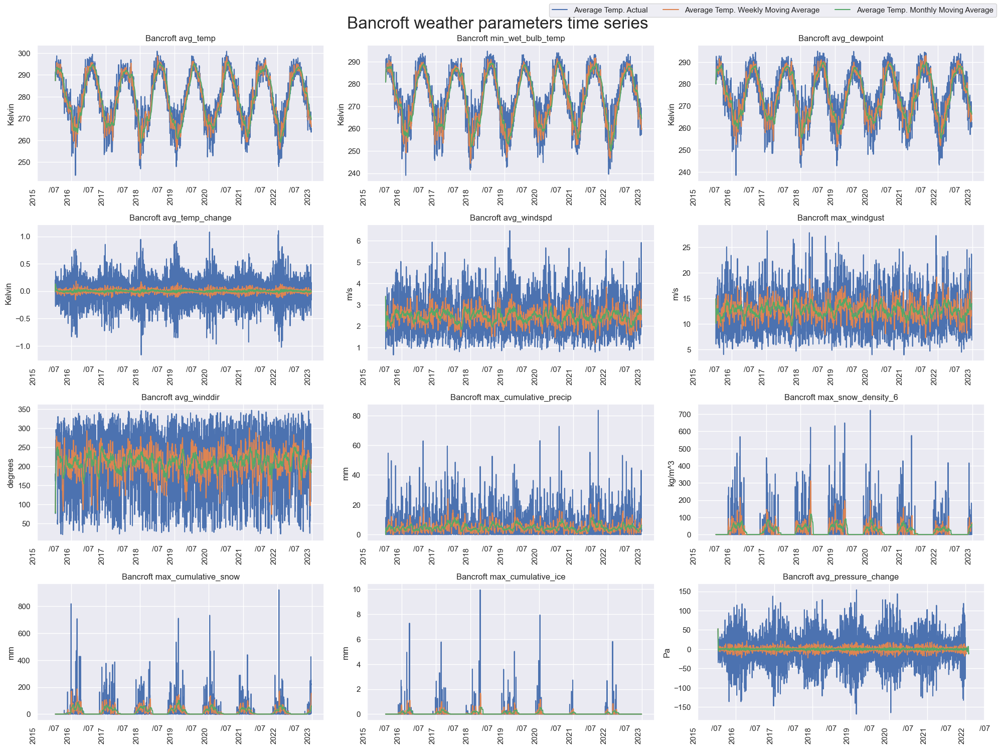

<Figure size 2000x1500 with 0 Axes>

In [30]:
import matplotlib.dates as mdates

rcParams['figure.figsize'] = 20, 15
sns.set(style="darkgrid")

parameters = [
        ('avg_temp', 'Kelvin'),
        ('min_wet_bulb_temp', 'Kelvin'),
        ('avg_dewpoint', 'Kelvin'),
        ('avg_temp_change', 'Kelvin'),
        ('avg_windspd', 'm/s'),
        ('max_windgust', 'm/s'),
        ('avg_winddir', 'degrees'),
        ('max_cumulative_precip', 'mm'),
        ('max_snow_density_6', 'kg/m^3'),
        ('max_cumulative_snow', 'mm'),
        ('max_cumulative_ice', 'mm'),
        ('avg_pressure_change', 'Pa')
    ]

def calculate_moving_averages(df, variables, time_periods): # has already been done in previous work at IBM (by Julian Erath) for the dataset # selected_variables = ['max_windgust', 'min_wet_bulb_temp', 'max_snow_density_6', 'max_cumulative_precip', 'max_cumulative_ice', 'max_cumulative_snow', 'avg_windspd','avg_pressure_change','avg_temp','avg_dewpoint','avg_winddir','avg_temp_change'] # selected_time_periods_week = [168] # selected_time_periods_month = [720]
    for variable in variables:
        for period in time_periods:
            ma_column_name = f'MA_{variable}_{period}_hours'
            df[ma_column_name] = df[variable].rolling(period, min_periods=1).mean()



def plot_weather_parameters(ax, data, parameter, unit):
    ax.plot(data.run_datetime, data[parameter], label=f'{parameter} Actual')
    ax.plot(data.run_datetime, data[f"MA_{parameter}_week"], label=f'{parameter} Weekly MA')
    ax.plot(data.run_datetime, data[f"MA_{parameter}_month"], label=f'{parameter} Monthly MA')
    ax.set_title(f'Bancroft {parameter}')
    ax.set_ylabel(unit)

    # Set the x-axis major locator to YearLocator and the formatter to the year
    ax.xaxis.set_major_locator(mdates.YearLocator())
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))

    # Manually add the mid-year tick for July 1st
    mid_years = [mdates.date2num(datetime.datetime(year, 7, 1)) for year in range(data.run_datetime.dt.year.min(), data.run_datetime.dt.year.max() + 1)]
    ax.set_xticks(list(ax.get_xticks()) + mid_years, minor=True)
    ax.xaxis.set_minor_formatter(mdates.DateFormatter('/%m'))

    # Rotate the labels for better visibility
    plt.setp(ax.xaxis.get_majorticklabels(), rotation=90, ha='right')

def create_subplots(data):
    fig, axes = plt.subplots(4, 3, figsize=[20,15])

    for i, (parameter, unit) in enumerate(parameters):
        plot_weather_parameters(axes[i // 3, i % 3], data, parameter, unit)

    plt.suptitle('Bancroft weather parameters time series', fontsize=24)
    plt.tight_layout()
    # Update the legend to handle multiple lines
    handles, labels = axes[0, 0].get_legend_handles_labels()
    new_labels = [label.replace("avg_temp", "Average Temp.").replace("MA", "Moving Average") for label in labels]
    fig.legend(handles, new_labels, loc='upper right', ncol=3)

    plt.show()
    plt.savefig('../output/Bancroft weather parameters time series.png')

create_subplots(df_full)


## Class Distribution of Blue Sky and Extreme Weather Events

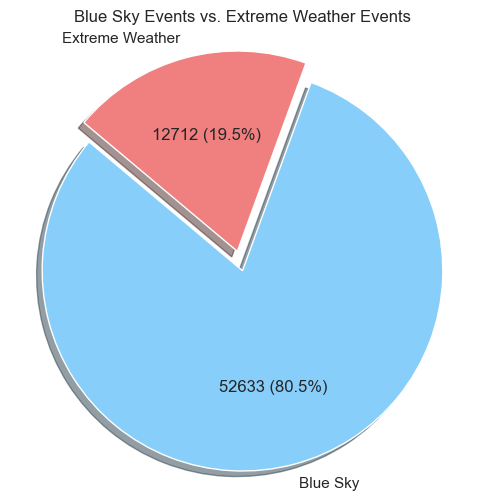

<Figure size 2000x1500 with 0 Axes>

In [31]:
# show data as pie chart
labels = ['Blue Sky', 'Extreme Weather']
sizes = df['label1'].value_counts()
colors = [ 'lightskyblue','lightcoral']
explode = (0.1, 0)  # explode first


# Plotting the pie chart
plt.figure(figsize=(6, 6))
plt.pie(sizes, explode=explode, labels=labels, colors=colors, autopct=lambda p: '{:.0f} ({:.1f}%)'.format(p * sum(sizes) / 100, p),
        shadow=True, startangle=140)
plt.axis('equal')
plt.title('Blue Sky Events vs. Extreme Weather Events')
plt.show()
plt.savefig('../output/Binary Classification Blue Sky vs Extreme Weather Events.png')


## Distribution of All Weather Events

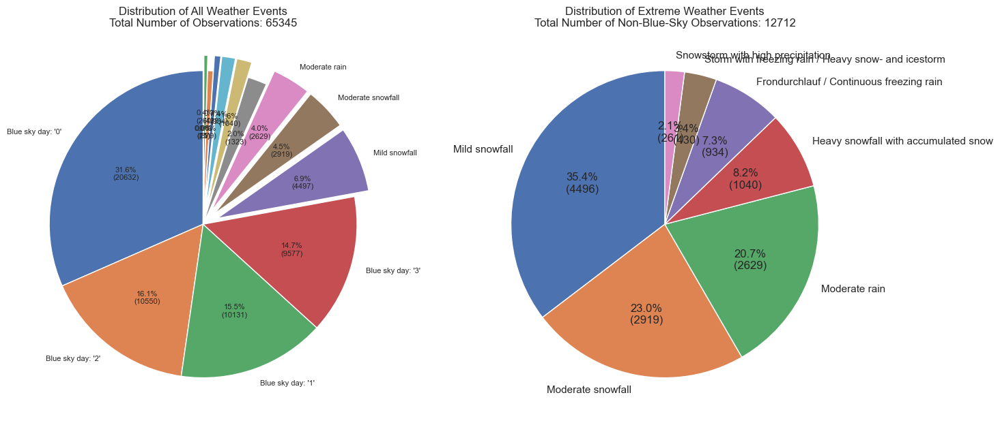

<Figure size 2000x1500 with 0 Axes>

In [32]:
# If 'Blue sky day' is present in 'wep', use 'label0'; otherwise, use 'wep'
df['display_label'] = df.apply(lambda row: f"{row['wep']}: '{row['label0']}'" if row['wep'] == 'Blue sky day' else row['wep'], axis=1)

# Count occurrences of weather events
weather_counts = df['display_label'].value_counts()

# Count occurrences of weather events excluding 'Blue sky day'
not_blue_sky_day_counts = df[df['wep'] != 'Blue sky day']['wep'].value_counts()

# Determine events to be exploded
explode_events = set(not_blue_sky_day_counts.index)

# Create explode list for the first chart
explode = [0.1 if event in explode_events else 0 for event in weather_counts.index]

# Total number of all samples
total_samples = len(df)

# Create the plot
plt.figure(figsize=(16, 8))

# Group categories and adjust labels
lower_half_threshold = weather_counts.quantile(0.5)
grouped_labels = [label if weather_counts[label] > lower_half_threshold else 'Other' for label in weather_counts.index]

# Pie chart for all weather events
plt.subplot(1, 2, 1)
patches, texts, autotexts = plt.pie(weather_counts, labels=grouped_labels, autopct=lambda p: f'{p:.1f}%\n({int(p/100*total_samples)})', startangle=90, explode=explode)
plt.title(f'Distribution of All Weather Events\nTotal Number of Observations: {total_samples}')

# Adjust text size and hide overlapping labels
for text, autotext in zip(texts, autotexts):
    if text.get_text() == 'Other':
        text.set_visible(False)
    text.set_fontsize(8)
    autotext.set_fontsize(8)

# Enlarged view for 'wep' != 'Blue sky day'
plt.subplot(1, 2, 2)
total_not_blue_samples = not_blue_sky_day_counts.sum()
plt.pie(not_blue_sky_day_counts, labels=not_blue_sky_day_counts.index, autopct=lambda p: f'{p:.1f}%\n({int(p/100*total_not_blue_samples)})', startangle=90)
plt.title(f'Distribution of Extreme Weather Events\nTotal Number of Non-Blue-Sky Observations: {total_not_blue_samples}')
plt.show()
plt.savefig('../output/Distribution of weather events pie chart.png')

## Association Plots and Correlation Analysis

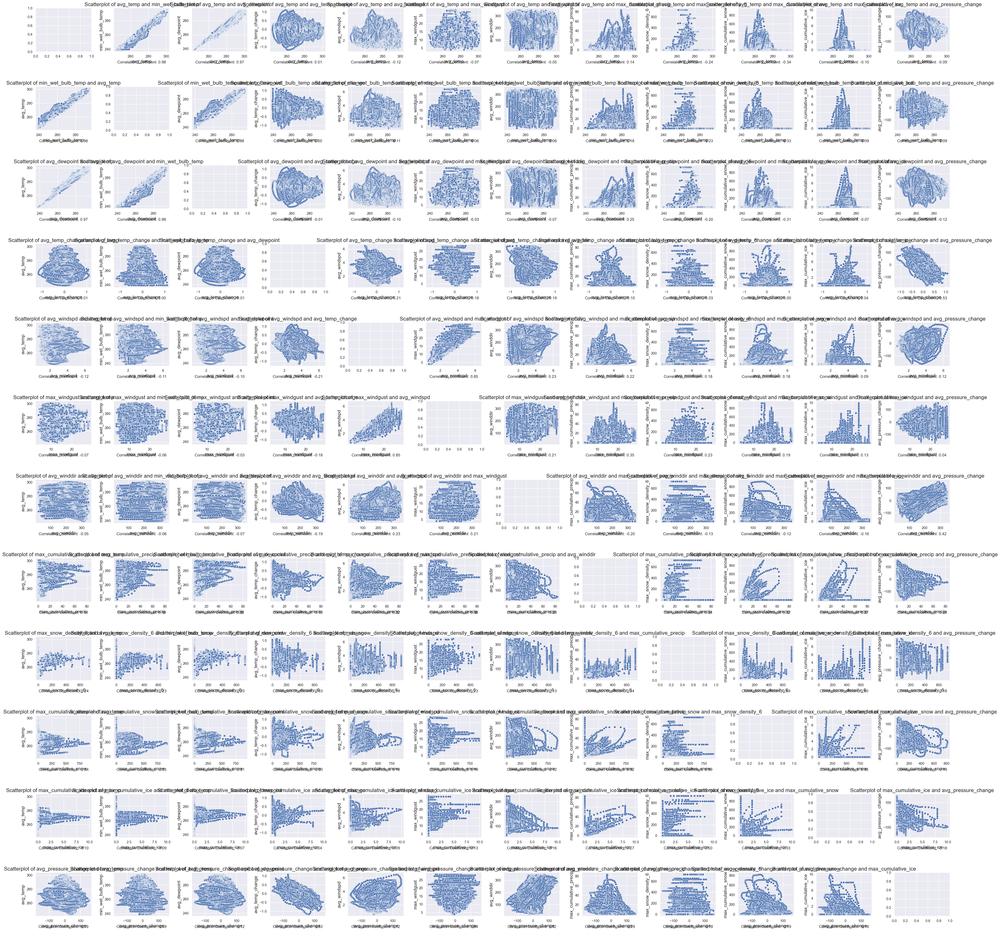

<Figure size 2000x1500 with 0 Axes>

In [33]:
# List of relevant weather parameters
relevant_parameters = ['avg_temp', 'min_wet_bulb_temp', 'avg_dewpoint', 'avg_temp_change', 'avg_windspd', 'max_windgust',
                       'avg_winddir', 'max_cumulative_precip', 'max_snow_density_6', 'max_cumulative_snow',
                       'max_cumulative_ice', 'avg_pressure_change']

# Display a scatter plot in a diagram with subplots for all parameter pairs
fig, axes = plt.subplots(len(relevant_parameters), len(relevant_parameters), figsize=(50, 50), gridspec_kw={'hspace': 0.8, 'wspace': 0.4})

# Function for calculating the correlation coefficient and displaying the scatterplot
def plot_scatter_and_correlation(ax, x, y, data):
    sns.scatterplot(x=x, y=y, data=data, ax=ax)
    correlation_coefficient = data[x].corr(data[y])
    ax.set_title(f'Scatterplot of {x} and {y}', fontsize=16)
    ax.set_xlabel(x, fontsize=14)
    ax.set_ylabel(y, fontsize=14)
    ax.text(0.5, -0.27, f'Correlation Coefficient: {correlation_coefficient:.2f}', transform=ax.transAxes, ha='center', fontsize=12)

# Loop over all parameters 
for i, feature_x in enumerate(relevant_parameters):
    for j, feature_y in enumerate(relevant_parameters):
        if i != j:  # Damit die Diagonale übersprungen wird (x gegen x)
            plot_scatter_and_correlation(axes[i, j], feature_x, feature_y, df)

plt.tight_layout()
plt.show()
plt.savefig('../output/Bancroft Association Plots.png')

## Distribution of Weather Features by Weather Event Profiles in Distograms

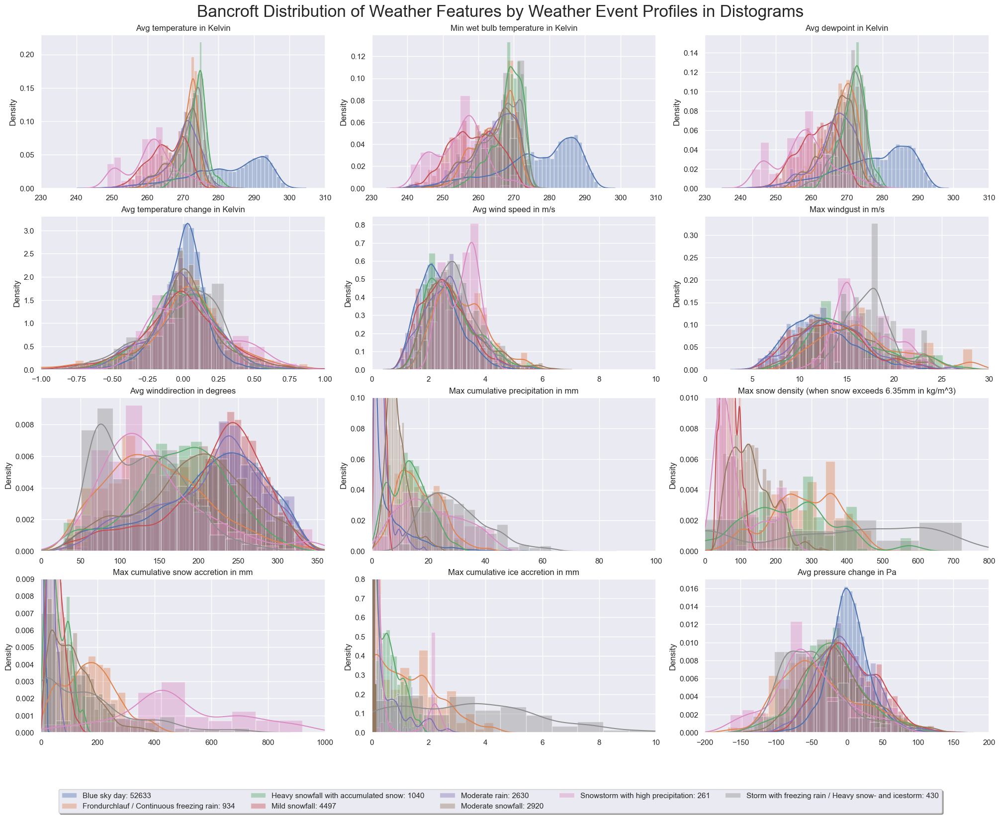

In [34]:

def plot_wep_features_distogram(df, label_col):

    f, axes = plt.subplots(4, 3, constrained_layout = True, figsize=[20,15])
    sns.set(style="darkgrid")
    for i in df[label_col].unique():
        df_cluster_distogram = df.loc[df[label_col] == i]
        axes = axes.ravel()
        num_label = df_cluster_distogram[label_col].value_counts()[i]
        for j, feature in enumerate(relevant_parameters):
            sns.distplot(df_cluster_distogram[feature], label=f'{i}: {num_label}', ax=axes[j])
            
    f.suptitle("Bancroft Distribution of Weather Features by Weather Event Profiles in Distograms", fontsize=24)
    
    axes[0].set(title="Avg temperature in Kelvin", xlim=(230, 310), xlabel="")
    h, l = axes[0].get_legend_handles_labels()
    axes[1].set(title="Min wet bulb temperature in Kelvin", xlim=(230, 310), xlabel="")
    axes[2].set(title="Avg dewpoint in Kelvin", xlim=(230, 310), xlabel="")
    axes[3].set(title="Avg temperature change in Kelvin", xlim=(-1, 1), xlabel="")
    axes[4].set(title="Avg wind speed in m/s", xlim=(0, 10), xlabel="")
    axes[5].set(title="Max windgust in m/s", xlim=(0, 30), xlabel="")
    axes[6].set(title="Avg winddirection in degrees", xlim=(0, 360), xlabel="")
    axes[7].set(title="Max cumulative precipitation in mm", xlim=(0, 100), ylim=(0, 0.1), xlabel="")
    axes[8].set(title="Max snow density (when snow exceeds 6.35mm in kg/m^3)", xlim=(0, 800), ylim=(0, 0.01), xlabel="")
    axes[9].set(title="Max cumulative snow accretion in mm", xlim=(0, 1000), ylim=(0, 0.009), xlabel="")
    axes[10].set(title="Max cumulative ice accretion in mm", xlim=(0, 10), ylim=(0, 0.8), xlabel="")
    axes[11].set(title="Avg pressure change in Pa",  xlim=(-200, 200), xlabel="")  
    f.legend(h, l, loc='upper center', bbox_to_anchor=(0.5, -0.05), fancybox=True, shadow=True, ncol=5)
    

data = df.dropna(subset=['wep'], how='any').sort_values('wep')
plot_wep_features_distogram(data, 'wep')
plt.savefig('../output/Bancroft_wep_parameter_distograms.png')

## Distribution of Weather Features by Weather Event Profiles in Boxplots

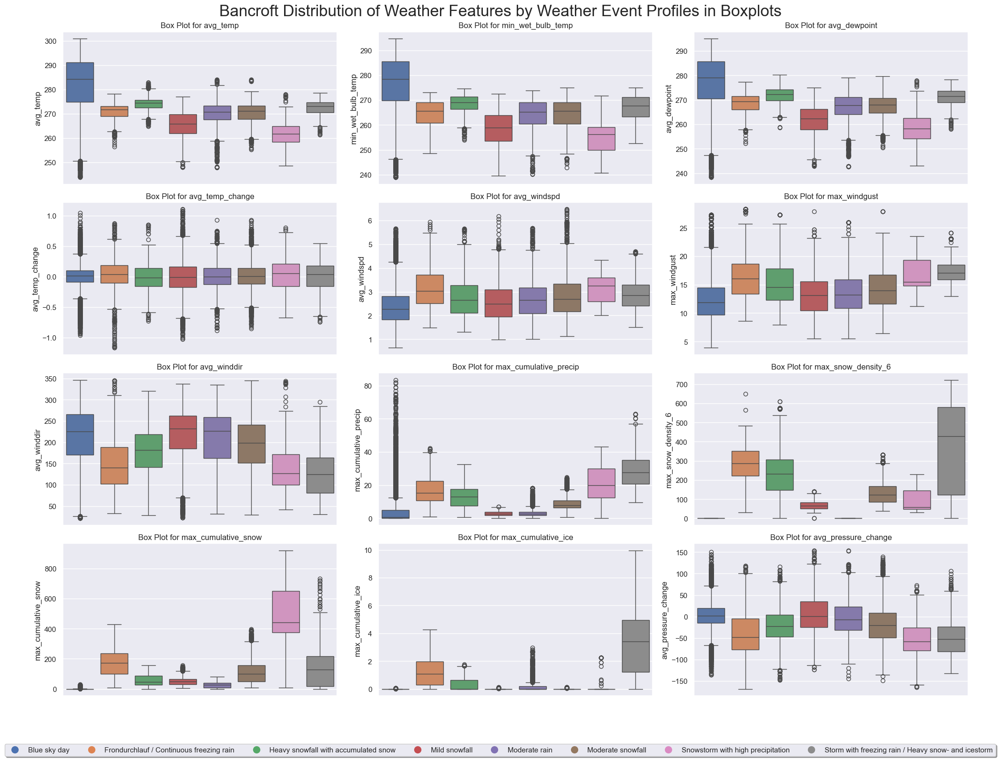

<Figure size 2000x1500 with 0 Axes>

In [35]:
def plot_wep_features_boxplot(df, label_col, relevant_parameters):
    unique_labels = df[label_col].unique()
    palette = sns.color_palette()
    label_colors = dict(zip(unique_labels, palette))

    f, axes = plt.subplots(4, 3, constrained_layout=True, figsize=[20, 15])
    sns.set(style="darkgrid")

    for j, feature in enumerate(relevant_parameters):
        ax = axes.flatten()[j]
        sns.boxplot(x=df[label_col], y=df[feature], ax=ax, palette=label_colors)

        ax.set_title(f'Box Plot for {feature}')
        ax.set_ylabel(feature)
        ax.set_xlabel('')
        ax.set_xticks([])
        ax.set_xticklabels([])
    f.suptitle("Bancroft Distribution of Weather Features by Weather Event Profiles in Boxplots", fontsize=24)
    handles = [plt.Line2D([0], [0], color=label_colors[label], marker='o', linestyle='', markersize=10) for label in unique_labels]
    f.legend(handles, unique_labels, loc='upper center', bbox_to_anchor=(0.5, -0.05), fancybox=True, shadow=True, ncol=len(unique_labels))
    plt.tight_layout()
    plt.show()

data = df.dropna(subset=['wep'], how='any').sort_values('wep')
plot_wep_features_boxplot(data, 'wep', relevant_parameters)
plt.savefig('../output/Bancroft_wep_parameter_boxplots.png')


## Analysis of Wind Speeds and Average Temperatures by Wind Direction

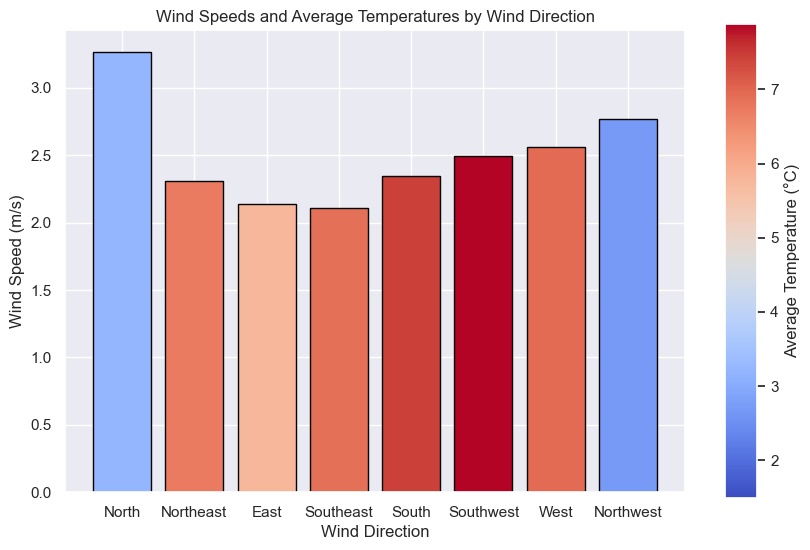

<Figure size 2000x1500 with 0 Axes>

In [36]:
def plot_wind_speed_and_avg_temp_by_direction(df_full, df, wind_direction_label, avg_temp_label, avg_windspd_label):
    # Calculate the average temperature for each wind direction
    avg_temp_by_direction = df_full.groupby(wind_direction_label)[avg_temp_label].mean().reset_index()

    # Order cardinal directions clockwise
    directions_ordered = ['North', 'Northeast', 'East', 'Southeast', 'South', 'Southwest', 'West', 'Northwest']
    avg_temp_by_direction[wind_direction_label] = pd.Categorical(avg_temp_by_direction[wind_direction_label], categories=directions_ordered, ordered=True)
    avg_temp_by_direction = avg_temp_by_direction.sort_values(wind_direction_label)

    # Color scale for temperature
    color_scale = plt.cm.get_cmap('coolwarm')

    # Create the bar chart
    fig, ax = plt.subplots(figsize=(8, 6))

    # Loop through the data and create bars with corresponding color
    for i, row in avg_temp_by_direction.iterrows():
        color = color_scale(row[avg_temp_label] / avg_temp_by_direction[avg_temp_label].max())
        wind_direction = row[wind_direction_label]
        average_wind_speed = df[df[wind_direction_label] == wind_direction][avg_windspd_label].mean()
        ax.bar(wind_direction, average_wind_speed, color=color, edgecolor='black')

    # Chart settings
    ax.set_xlabel('Wind Direction')
    ax.set_ylabel('Wind Speed (m/s)')
    ax.set_title('Wind Speeds and Average Temperatures by Wind Direction')

    # Create a separate Axes for the colorbar
    cax = fig.add_axes([0.95, 0.1, 0.04, 0.79])

    # Add color legend
    temperature_min = avg_temp_by_direction[avg_temp_label].min()
    temperature_max = avg_temp_by_direction[avg_temp_label].max()
    sm = plt.cm.ScalarMappable(cmap=color_scale, norm=plt.Normalize(vmin=temperature_min, vmax=temperature_max))
    sm.set_array([])  # empty data for the color legend
    cbar = plt.colorbar(sm, cax=cax, orientation='vertical')
    cbar.set_label('Average Temperature (°C)')

    # Show the chart
    plt.show()

# Beispielaufruf der Funktion
plot_wind_speed_and_avg_temp_by_direction(df_full, df, 'wind_direction_label', 'avg_temp_celsius', 'avg_windspd')
plt.savefig('../output/Bancroft Wind Speeds and Average Temperatures by Wind Direction.png')

## 3D plot of all weather observations using PCA

In [37]:
feature_columns = df.columns
columns_to_exclude = ['wep', 'run_datetime', 'avg_temp_celsius', 'avg_winddir', 'wind_direction_label', 'label0', 'label1', 'label2', 'year', 'month', 'display_label']
feature_columns = [col for col in feature_columns if col not in columns_to_exclude]

X = df[feature_columns].dropna()
X_standardized = StandardScaler().fit_transform(X)

# Apply PCA to reduce dimensionality to 3 components
pca = PCA(n_components=3)
X_pca = pca.fit_transform(X_standardized)

# Create a DataFrame with PCA results and 'wep' label
pca_df = pd.DataFrame(data=X_pca, columns=['PC1', 'PC2', 'PC3'])
pca_df['wep'] = df.loc[X.index, 'wep']

# Create an interactive 3D scatter plot using Plotly Express with smaller dots
fig = px.scatter_3d(pca_df, x='PC1', y='PC2', z='PC3', color='wep', symbol='wep', size_max=2, opacity=0.7,
                    labels={'wep': 'Weather'}, title='Interactive 3D PCA Plot of Weather Data')

# Update layout for better visualization
fig.update_layout(margin=dict(l=0, r=0, b=0, t=0))

# Update marker size for better visibility
fig.update_traces(marker=dict(size=2),
                  selector=dict(mode='markers'))

# Increase marker size in the legend
fig.update_layout(legend=dict(
    itemsizing='constant'
))

# Show the plot
fig.show()

## Methodology and results binary classification

In [38]:
#copy df
df_class = df

# Calculate the mean value of the column
mean_value = df_class["avg_pressure_change"].mean()

#set "avg_temp_change" to 0 in the first row, as there is no temp change
df_class.at[0, 'avg_temp_change'] = 0

#drop columns, which are not numeric and not needed
df_class = df_class.drop(columns = ['wep','wind_direction_label', 'run_datetime','label2','avg_pressure_change','label0', 'display_label'])

## Define predictor variables
X = df_class.drop(columns = ['label1', 'max_snow_density_6'])

## Define response variable
y = df_class['label1']

# Split the dataset into training and testing data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize the classifiers
classifiers = {
    'ExtraTrees': ExtraTreesClassifier(),
    'XGBoost': XGBClassifier(),
    'LGBM': LGBMClassifier(verbose=-1),
    'RandomForest': RandomForestClassifier()
}

# Train the classifiers and collect accuracies
accuracies = {}

for idx, (name, clf) in enumerate(classifiers.items()):
    clf.fit(X_train, y_train)
    y_pred = clf.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    accuracies[name] = accuracy
    print(f'{name} Accuracy: {accuracy}')

NameError: name 'LGBMClassifier' is not defined

In [ ]:
# Set up subplots for confusion matrices
fig, axes = plt.subplots(2, 2, figsize=(18, 10))

# Flatten the axes array for easy iteration
axes_confusion = axes.flatten()

# Create an empty list to store classification reports
classification_reports = []

# Iterate over classifiers and plot confusion matrices
for ax, (name, model) in zip(axes_confusion, classifiers.items()):
    # Create a pipeline with StandardScaler and the current model
    pipe = make_pipeline(StandardScaler(), model)
    pipe.fit(X_train, y_train)
    y_pred = pipe.predict(X_test)

    # Calculate confusion matrix
    cm = confusion_matrix(y_test, y_pred)

    # Plot heatmap for confusion matrix
    sns.heatmap(cm, annot=True, fmt=".0f", linewidths=.5, square=True, cmap='Blues', ax=ax)

    # Set labels and title
    ax.set_xlabel('Predicted Label')
    ax.set_ylabel('True Label')
    ax.set_title(f'{name} Confusion Matrix')

    # Calculate and store classification report
    report = classification_report(y_test, y_pred, output_dict=True)
    classification_reports.append((name, report))

# Set up subplots for classification reports
fig, axes_reports = plt.subplots(2, 2, figsize=(20, 15))

# Flatten the axes array for easy iteration
axes_reports = axes_reports.flatten()

# Iterate over classification reports and plot heatmaps
for ax, (name, report) in zip(axes_reports, classification_reports):
    # Plot heatmap for classification report
    sns.heatmap(pd.DataFrame(report).iloc[:-1, :].T, annot=True, cmap='Blues', ax=ax)

    # Set labels and title
    ax.set_xlabel('Metrics')
    ax.set_ylabel('Classes')
    ax.set_title(f'{name} Classification Report')

# Adjust layout for better spacing
plt.tight_layout()

# Show the plots
plt.show()
plt.savefig('../output/Binary Classification Confusion Matrix and Classification Report.png')


## Methodology and results multiclass classification

In [ ]:
# Creating new dataframe that only includes extreme weather observations
df_extreme_weather = pd.DataFrame(df)
df_extreme_weather = df_extreme_weather[df_extreme_weather['label1'] != 1]

# Dropping NaN
df_extreme_weather = df_extreme_weather.dropna()

knn_model = KNeighborsClassifier(
    n_neighbors=5, 
    weights='uniform', 
    algorithm='auto', 
    leaf_size=30, 
    p=2, 
    metric='minkowski', 
    metric_params=None, 
    n_jobs=None)
svm_model = svm.SVC(
    C=1.0, 
    kernel='rbf', 
    degree=3, 
    gamma='scale', 
    coef0=0.0, 
    tol=0.001, 
    cache_size=800, 
    class_weight='balanced', 
    random_state=42)
dtc_model = DecisionTreeClassifier(
    criterion="entropy", 
    class_weight="balanced", 
    max_depth=10, 
    min_samples_leaf=3, 
    max_features=None, 
    random_state=42)
gbc_model = GradientBoostingClassifier(
    loss='log_loss', 
    learning_rate=0.1, 
    n_estimators=100, 
    subsample=1.0, 
    criterion='friedman_mse', 
    min_samples_split=2, 
    min_samples_leaf=3, 
    min_weight_fraction_leaf=0.0, 
    max_depth=10, 
    )

# Defining the dependent and independent variables
X = df_extreme_weather.drop(columns=["label0", "label1", "label2", "wep", "avg_winddir", "wind_direction_label", "avg_temp_celsius", "run_datetime","display_label"])# Features
y = df_extreme_weather['label2'] # Labels

# Split into train and test
X_train, X_test, Y_train, Y_test = train_test_split(X, y, test_size=0.3, random_state=42)
knn_model_fit = knn_model.fit(X_train, Y_train)
svm_model_fit = svm_model.fit(X_train, Y_train)
dtc_model_fit = dtc_model.fit(X_train, Y_train)
gbc_model_fit = gbc_model.fit(X_train, Y_train)
# Predict using the trained KNN model on the test set
Y_pred_knn = knn_model_fit.predict(X_test)
# Generate the confusion matrix for K-Nearest Neighbors
cm_knn = confusion_matrix(Y_test, Y_pred_knn)
# Predict using the trained SVM model on the test set
Y_pred_svm = svm_model_fit.predict(X_test)
# Generate the confusion matrix for Support Vector Machine
cm_svm = confusion_matrix(Y_test, Y_pred_svm)
# Make predictions using the Decision Tree Classifier (DTC) model on the test set
Y_pred_dtc = dtc_model_fit.predict(X_test)
# Generate the confusion matrix for Decision Tree Classifier
cm_dtc = confusion_matrix(Y_test, Y_pred_dtc)
# Make predictions using the Gradient Boosting Classifier (GBC) model on the test set
Y_pred_gbc = gbc_model_fit.predict(X_test)
# Generate the confusion matrix for Gradient Boosting Classifier
cm_gbc = confusion_matrix(Y_test, Y_pred_gbc)

# Plot all confusion matrices in subplots
fig, axs = plt.subplots(2, 2, figsize=(15, 12))

# K-Nearest Neighbors Confusion Matrix
sns.heatmap(cm_knn, annot=True, fmt='d', cmap='Blues', ax=axs[0, 0])
axs[0, 0].set_title('K-Nearest Neighbors Confusion Matrix')
axs[0, 0].set_xlabel('Predicted')
axs[0, 0].set_ylabel('True')
# Support Vector Machine Confusion Matrix
sns.heatmap(cm_svm, annot=True, fmt='d', cmap='Blues', ax=axs[0, 1])
axs[0, 1].set_title('Support Vector Machine Confusion Matrix')
axs[0, 1].set_xlabel('Predicted')
axs[0, 1].set_ylabel('True')
# Decision Tree Classifier Confusion Matrix
sns.heatmap(cm_dtc, annot=True, fmt='d', cmap='Blues', ax=axs[1, 0])
axs[1, 0].set_title('Decision Tree Classifier Confusion Matrix')
axs[1, 0].set_xlabel('Predicted')
axs[1, 0].set_ylabel('True')
# Gradient Boosting Classifier Confusion Matrix
sns.heatmap(cm_gbc, annot=True, fmt='d', cmap='Blues', ax=axs[1, 1])
axs[1, 1].set_title('Gradient Boosting Classifier Confusion Matrix')
axs[1, 1].set_xlabel('Predicted')
axs[1, 1].set_ylabel('True')
# Adjust layout
plt.tight_layout()
# Show the plot
plt.show()

# Classification report for K-Nearest Neighbors
report_knn = classification_report(Y_test, Y_pred_knn, target_names=df_extreme_weather['label2'].unique(), output_dict=True)
# Classification report for Support Vector Machine
report_svm = classification_report(Y_test, Y_pred_svm, target_names=df_extreme_weather['label2'].unique(), output_dict=True)
# Classification report for Decision Tree Classifier
report_dtc = classification_report(Y_test, Y_pred_dtc, target_names=df_extreme_weather['label2'].unique(), output_dict=True)
# Classification report for Gradient Boosting Classifier
report_gbc = classification_report(Y_test, Y_pred_gbc, target_names=df_extreme_weather['label2'].unique(), output_dict=True)

# Creating a table with classification reports
fig, axs = plt.subplots(2, 2, figsize=(15, 12))
# K-Nearest Neighbors Classification Report Table
sns.heatmap(pd.DataFrame(report_knn).iloc[:-1, :].T, annot=True, cmap='Blues', ax=axs[0, 0])
axs[0, 0].set_title('K-Nearest Neighbors Classification Report')
axs[0, 0].set_xlabel('Metrics')
axs[0, 0].set_ylabel('Classes')
# Support Vector Machine Classification Report Table
sns.heatmap(pd.DataFrame(report_svm).iloc[:-1, :].T, annot=True, cmap='Blues', ax=axs[0, 1])
axs[0, 1].set_title('Support Vector Machine Classification Report')
axs[0, 1].set_xlabel('Metrics')
axs[0, 1].set_ylabel('Classes')
# Decision Tree Classifier Classification Report Table
sns.heatmap(pd.DataFrame(report_dtc).iloc[:-1, :].T, annot=True, cmap='Blues', ax=axs[1, 0])
axs[1, 0].set_title('Decision Tree Classifier Classification Report')
axs[1, 0].set_xlabel('Metrics')
axs[1, 0].set_ylabel('Classes')
# Gradient Boosting Classifier Classification Report Table
sns.heatmap(pd.DataFrame(report_gbc).iloc[:-1, :].T, annot=True, cmap='Blues', ax=axs[1, 1])
axs[1, 1].set_title('Gradient Boosting Classifier Classification Report')
axs[1, 1].set_xlabel('Metrics')
axs[1, 1].set_ylabel('Classes')
# Adjust layout
plt.tight_layout()
# Show the plot
plt.show()

# Visualize the Decision Tree with adjusted layout
plt.figure(figsize=(50, 30))
fig = plot_tree(dtc_model,
                filled=True,
                rounded=True,
                fontsize=12)
plt.show()


## Sources

[^1]: de Lima, Glauston, R.T. / Stephan, S. (2013): A new classification approach for detecting severe weather patterns, in: Computers & geosciences 57 (2013): 158-165.
[^2]: ECMWF (2023a): ERA5: data documentation. URL: https://confluence.ecmwf.int/display/CKB/ERA5%3A+data+documentation
[^3]: Liljequist, G.H. / Cehak, K. (1984): Allgemeine Meteorologie. 3. Auflage, Springer-Verlag.
[^4]: Fathi, M. / Haghi Kashani, M. / Jameii, S. M. / Mahdipour, E. (2022): Big Data Analytics in Weather Forecasting: A Systematic Review, in: Archives of Computational Methods in Engineering 29.2 (2022, Springer): 1247–1275
[^5]: Hjelmfelt, M.R. (1990): Numerical study of the influence of environmental conditions on lake-effect snowstorms over Lake Michigan, in: Monthly Weather Review, 118(1), pp.138-150.
[^6]: Ghirardelli, J.E. (2005): An Overview of the Redeveloped Localized Aviation Mos Program (Lamp) For Short-Range Forecasting.
[^7]: [The contribution of weather forecast information to agriculture, water, and energy sectors in East and West Africa](https://www.frontiersin.org/articles/10.3389/fenvs.2022.935696/full)
[^8]: [A Hybrid Dataset of Historical Cool-Season Lake Effects From the Eastern Great Lakes of North America](https://www.frontiersin.org/journals/water/articles/10.3389/frwa.2022.788493/full)
[^9]: [Evaluation of spatial-temporal variation performance of ERA5 precipitation data in China](https://www.nature.com/articles/s41598-021-97432-y)
[^10]: ECMWF (2023b): ERA5: reanalysis datasets for forecasts. URL: https://www.ecmwf.int/en/forecasts/datasets/reanalysis-datasets/era5
[^11]: Fathi, M. / Haghi Kashani, M. / Jameii, S. M. / Mahdipour, E. (2022): Big Data Analytics in Weather Forecasting: A Systematic Review, in: Archives of Computational Methods in Engineering 29.2 (2022, Springer): 1247–1275
[^12]: Gregor, S. / Hevner, A.R. (2013): Positioning and Presenting Design Science Research for Maximum Impact, in: MIS Quarterly, Jg. 37, Nr. 2, S. 337-355; Hevner, A. / Chatterjee, S. (2010): Design Research in Information Systems, Theory and Practice. Hrsg. von R. Sharda/S. Voß. Bd. 22. Integrated Series in Information Systems. New York, NY, USA: Springer New York, NY.; Hevner, A. / March, S.T. / Park, J. / Ram, S. (2004): Design Science in Information Systems Research, in: MIS Quaterly 28.1, S. 75–105.
[^13]: [Design Science in Information Systems Research.](https://www.researchgate.net/publication/201168946_Design_Science_in_Information_Systems_Research)
[^14]: Wilde, T. and Hess, T., 2007. Forschungsmethoden der wirtschaftsinformatik. Wirtschaftsinformatik, 4(49), pp.280-287.; Goldman, N. and Narayanaswamy, K., 1992, June. Software evolution through iterative prototyping. In Proceedings of the 14th international conference on Software engineering (pp. 158-172).
[^15]: [Reflective physical prototyping through integrated design, test, and analysis](https://www.researchgate.net/publication/220877433_Reflective_physical_prototyping_through_integrated_design_test_and_analysis)
[^16]: Shao, J., 1993. Linear model selection by cross-validation. Journal of the American statistical Association, pp.486-494.; Browne, M.W., 2000. Cross-validation methods. Journal of mathematical psychology, 44(1), pp.108-132.
[^17]: Webster, J. / Watson, R.T. (2002): Analyzing the past to prepare for the future: Writing a literature review, in: MIS quarterly. Jun 1: xiii-xiii.
[^18]: ECMWF (2023c): ERA5: data documentation parameterlistings. URL: https://confluence.ecmwf.int/display/CKB/ERA5%3A+data+documentation#ERA5:datadocumentation-Parameterlistings
[^19]: ECMWF (2023a): ERA5: data documentation. URL: https://confluence.ecmwf.int/display/CKB/ERA5%3A+data+documentation
[^22]: Scikit-learn (2023a): https://scikit-learn.org/stable/documentation.html
[^23]: Hastie, T., Tibshirani, R., & Friedman, J. (2009). The Elements of Statistical Learning.
